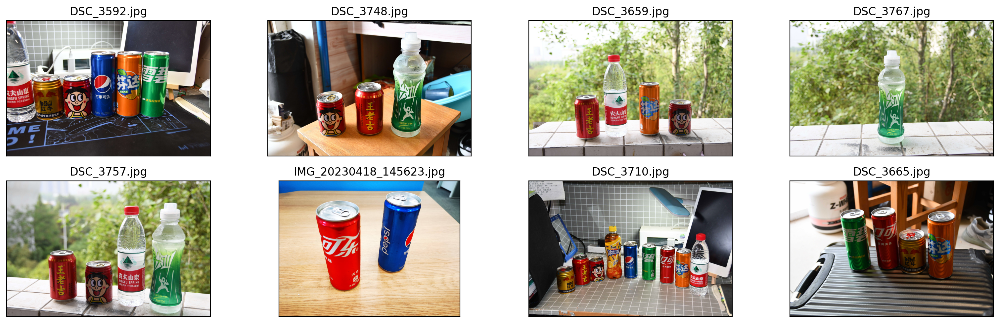

In [3]:
# 数据集可视化

import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

image_paths= [filename for filename in os.listdir('data/Drink_284_Detection_coco/Drink_284_Detection_coco/images')][:8]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open('data/Drink_284_Detection_coco/Drink_284_Detection_coco/images/'+filename).convert("RGB")
  
    plt.subplot(2, 4, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

loading annotations into memory...
Done (t=0.11s)
creating index...
index created!


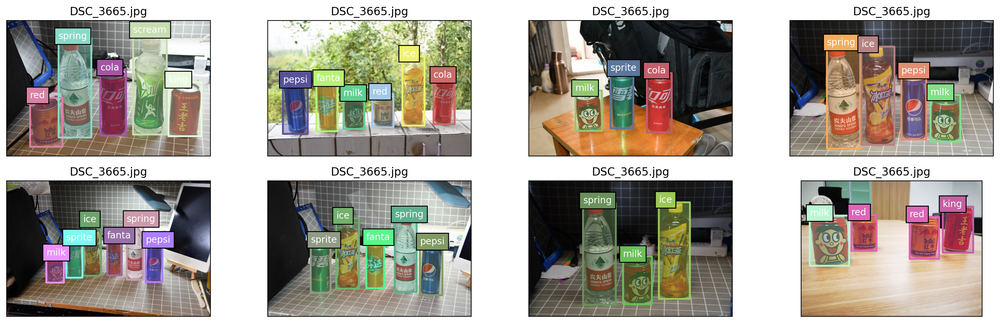

In [4]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image

    try:
        exif = image.getexif()
    except Exception:
        exif = None

    if exif is None:
        return image

    orientation = exif.get(_EXIF_ORIENT)

    method = {
        2: Image.FLIP_LEFT_RIGHT,
        3: Image.ROTATE_180,
        4: Image.FLIP_TOP_BOTTOM,
        5: Image.TRANSPOSE,
        6: Image.ROTATE_270,
        7: Image.TRANSVERSE,
        8: Image.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image


def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    """Show bounding box of annotations Only."""
    if len(anns) == 0:
        return

    ax = plt.gca()
    ax.set_autoscale_on(False)

    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]

    polygons = []
    colors = []

    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4, 2))))
        colors.append(color)

        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None

        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox)

    if is_filling:
        p = PatchCollection(
            polygons, facecolor=colors, linewidths=0, alpha=0.4)
        ax.add_collection(p)
    p = PatchCollection(
        polygons, facecolor='none', edgecolors=colors, linewidths=2)
    ax.add_collection(p)


coco = COCO('data/Drink_284_Detection_coco/Drink_284_Detection_coco/train_coco.json')
image_ids = coco.getImgIds()
np.random.shuffle(image_ids)

plt.figure(figsize=(16, 5))

# 只可视化 8 张图片
for i in range(8):
    image_data = coco.loadImgs(image_ids[i])[0]
    image_path = osp.join('data/Drink_284_Detection_coco/Drink_284_Detection_coco/images/',image_data['file_name'])
    annotation_ids = coco.getAnnIds(
            imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)
    
    ax = plt.subplot(2, 4, i+1)
    image = Image.open(image_path).convert("RGB")
    
    # 这行代码很关键，否则可能图片和标签对不上
    image=apply_exif_orientation(image)
    
    ax.imshow(image)
    
    show_bbox_only(coco, annotations)
    
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])
        
plt.tight_layout()

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!


/HOME/scz0brk/.conda/envs/mmdet/lib/python3.9/site-packages/mmengine/utils/manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


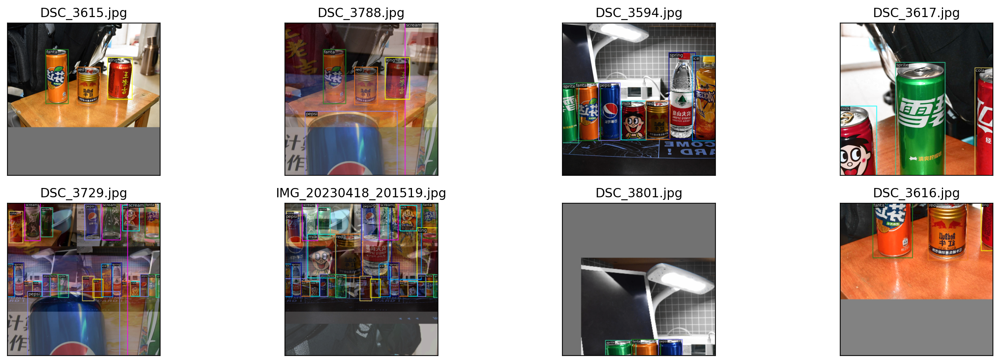

In [6]:
from mmdet.registry import DATASETS, VISUALIZERS
from mmengine.config import Config
from mmengine.registry import init_default_scope
import matplotlib.pyplot as plt
import os.path as osp

%matplotlib inline

cfg = Config.fromfile('config/rtm-det_100e.py')

init_default_scope(cfg.get('default_scope', 'mmdet'))

dataset = DATASETS.build(cfg.train_dataloader.dataset)
visualizer = VISUALIZERS.build(cfg.visualizer)
visualizer.dataset_meta = dataset.metainfo

plt.figure(figsize=(16, 5))

# 只可视化前 8 张图片
for i in range(8):
   item=dataset[i]

   img = item['inputs'].permute(1, 2, 0).numpy()
   data_sample = item['data_samples'].numpy()
   gt_instances = data_sample.gt_instances
   img_path = osp.basename(item['data_samples'].img_path)

   gt_bboxes = gt_instances.get('bboxes', None)
   gt_instances.bboxes = gt_bboxes.tensor
   data_sample.gt_instances = gt_instances

   visualizer.add_datasample(
            osp.basename(img_path),
            img,
            data_sample,
            draw_pred=False,
            show=False)
   drawed_image=visualizer.get_image()

   plt.subplot(2, 4, i+1)
   plt.imshow(drawed_image[..., [2, 1, 0]])
   plt.title(f"{osp.basename(img_path)}")
   plt.xticks([])
   plt.yticks([])

plt.tight_layout()  

Loads checkpoint by local backend from path: ./work_dirs/rtm-det_100e/best_coco/bbox_mAP_epoch_96.pth


/HOME/scz0brk/.conda/envs/mmdet/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


<DetDataSample(

    META INFORMATION
    img_path: None
    batch_input_shape: (640, 640)
    ori_shape: (596, 801)
    img_id: 0
    img_shape: (640, 640)
    pad_shape: (640, 640)
    scale_factor: (0.7990012484394506, 0.7986577181208053)

    DATA FIELDS
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: tensor([[440.2627,  65.1301, 603.7162, 569.3215],
                        [298.3746,  40.6329, 455.9912, 565.2858],
                        [705.0327,  27.0837, 799.1712, 571.3880],
                        ...,
                        [738.4343,  80.3822, 799.4337, 198.4480],
                        [785.9568,  36.3485, 800.9556, 257.1329],
                        [730.8589,  95.1923, 800.4285, 244.7573]])
            labels: tensor([6, 5, 6, 6, 5, 6, 5, 6, 6, 6, 4, 6, 9, 6, 0, 6, 6, 5, 6, 6, 6, 6, 4, 4,
                        4, 6, 6, 6, 4, 2, 7, 6, 6, 6, 6, 4, 6, 6, 2, 6, 6, 6, 6, 6, 6, 6, 6, 2,
         

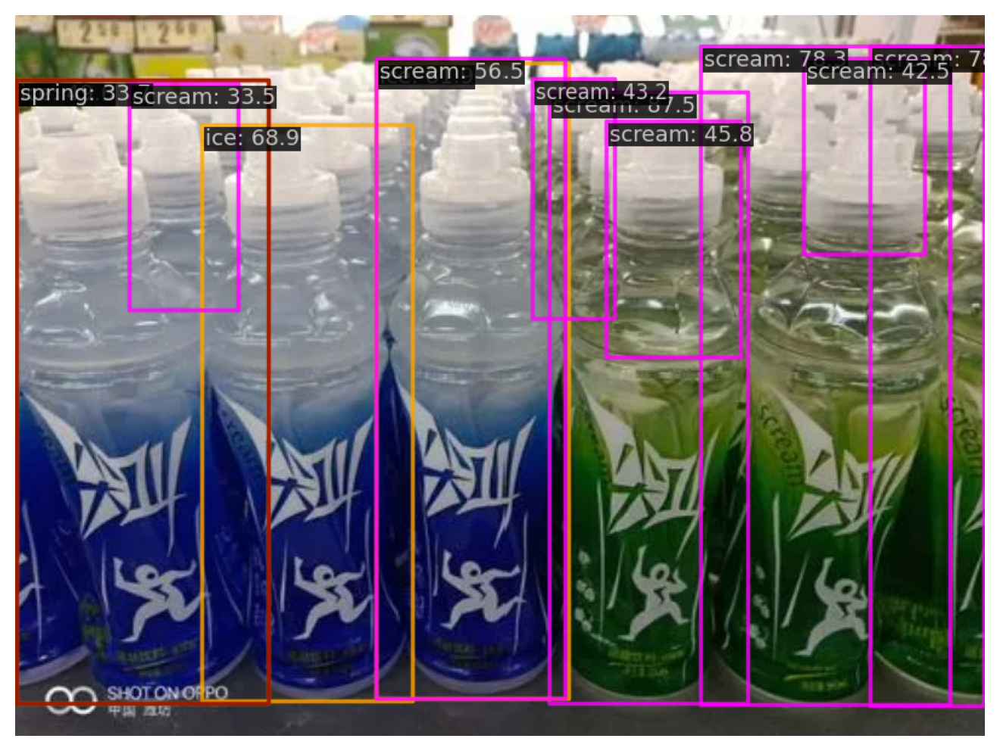

In [7]:
# test a single image

from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
from mmdet.registry import VISUALIZERS
import mmcv

config_file = './config/rtm-det_100e.py'
checkpoint_file = './work_dirs/rtm-det_100e/best_coco/bbox_mAP_epoch_96.pth'

register_all_modules()

model = init_detector(config_file, checkpoint_file, device='cpu')  # or device='cuda:0'

img = mmcv.imread( './test/jianjiao.jpg', channel_order='rgb')
result = inference_detector(model, img)
print(result)

# show the results
visualizer.add_datasample(
    'result',
    img,
    data_sample=result,
    draw_gt=False,
    wait_time=0,
)
visualizer.show()

In [ ]:
!python tools/image_demo.py test/ \
        ./config/rtm-det_100e.py \
        --weights ./work_dirs/rtm-det_100e/best_coco/bbox_mAP_epoch_96.pth \
        --out-dir outputs/ \
        --device cpu \
        --pred-score-thr 0.3 \
        --batch-size 1 \
        --show \
        --print-result